In [0]:
import os
import torch
import torchvision
import torch.nn as nn
from torchvision import transforms
from torchvision.utils import save_image
# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# Hyper-parameters
latent_size = 64
hidden_size = 256
image_size = 784
num_epochs = 200
batch_size = 100
sample_dir = '/content/'

In [0]:
# Image processing
transform = transforms.Compose([transforms.ToTensor(),
 transforms.Normalize((0.5,), (0.5,))])
# MNIST dataset
mnist = torchvision.datasets.MNIST(root='../../data/',
                                  train=True,
                                  transform=transform,
                                  download=True)
# Data loader
data_loader = torch.utils.data.DataLoader(dataset=mnist,
                                         batch_size=batch_size,
                                         shuffle=True)
# Discriminator
D = nn.Sequential(
   nn.Linear(image_size, hidden_size),
   nn.LeakyReLU(0.2),
   nn.Linear(hidden_size, hidden_size),
   nn.LeakyReLU(0.2),
   nn.Linear(hidden_size, 1),
   nn.Sigmoid())
# Generator
G = nn.Sequential(
   nn.Linear(latent_size, hidden_size),
   nn.ReLU(),
   nn.Linear(hidden_size, hidden_size),
   nn.ReLU(),
   nn.Linear(hidden_size, image_size),
   nn.Tanh())

0it [00:00, ?it/s]

9920512it [00:02, 3621828.68it/s]                             


Extracting ../../data/MNIST/raw/train-images-idx3-ubyte.gz to ../../data/MNIST/raw


0it [00:00, ?it/s]

32768it [00:00, 56860.88it/s]                           
0it [00:00, ?it/s]

Extracting ../../data/MNIST/raw/train-labels-idx1-ubyte.gz to ../../data/MNIST/raw


1654784it [00:01, 931947.03it/s]                            
0it [00:00, ?it/s]

Extracting ../../data/MNIST/raw/t10k-images-idx3-ubyte.gz to ../../data/MNIST/raw


8192it [00:00, 20994.70it/s]            

Extracting ../../data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ../../data/MNIST/raw
Processing...
Done!


In [0]:
# Device setting
D = D.to(device)
G = G.to(device)

# Binary cross entropy loss and optimizer
criterion = nn.BCELoss()
d_optimizer = torch.optim.Adam(D.parameters(), lr=0.0002)
g_optimizer = torch.optim.Adam(G.parameters(), lr=0.0002)
def denorm(x):
   out = (x + 1) / 2
   return out.clamp(0, 1)
def reset_grad():
   d_optimizer.zero_grad()
   g_optimizer.zero_grad()

In [4]:
# Start training
total_step = len(data_loader)
for epoch in range(num_epochs):
   for i, (images, _) in enumerate(data_loader):
       images = images.reshape(batch_size, -1).to(device)
       # Create the labels which are later used as input for the BCE loss
       real_labels = torch.ones(batch_size, 1).to(device)
       fake_labels = torch.zeros(batch_size, 1).to(device)
       # ================================================================== #
       #                      Train the discriminator                       #
       # ================================================================== #
       # Compute BCE_Loss using real images where BCE_Loss(x, y): - y * log(D(x)) - (1-y) * log(1 - D(x))
       # Second term of the loss is always zero since real_labels == 1
       outputs = D(images)
       d_loss_real = criterion(outputs, real_labels)
       real_score = outputs
       # Compute BCELoss using fake images
       # First term of the loss is always zero since fake_labels == 0
       z = torch.randn(batch_size, latent_size).to(device)
       fake_images = G(z)
       outputs = D(fake_images)
       d_loss_fake = criterion(outputs, fake_labels)
       fake_score = outputs
       # Backprop and optimize
       d_loss = d_loss_real + d_loss_fake
       reset_grad()
       d_loss.backward()
       d_optimizer.step()
       # ================================================================== #
       #                        Train the generator                         #
       # ================================================================== #
       # Compute loss with fake images
       z = torch.randn(batch_size, latent_size).to(device)
       fake_images = G(z)
       outputs = D(fake_images)
       # We train G to maximize log(D(G(z)) instead of minimizing log(1-D(G(z)))
       # For the reason, see the last paragraph of section 3. https://arxiv.org/pdf/1406.2661.pdf
       g_loss = criterion(outputs, real_labels)
       # Backprop and optimize
       reset_grad()
       g_loss.backward()
       g_optimizer.step()
       if (i+1) % 200 == 0:
           print('Epoch [{}/{}], Step [{}/{}], d_loss: {:.4f}, g_loss: {:.4f}, D(x): {:.2f}, D(G(z)): {:.2f}'
                 .format(epoch, num_epochs, i+1, total_step, d_loss.item(), g_loss.item(),
                         real_score.mean().item(), fake_score.mean().item()))
   # Save real images
   if (epoch+1) == 1:
       images = images.reshape(images.size(0), 1, 28, 28)
       save_image(denorm(images), os.path.join(sample_dir, 'real_images.png'))
   # Save sampled images
   fake_images = fake_images.reshape(fake_images.size(0), 1, 28, 28)
   save_image(denorm(fake_images), os.path.join(sample_dir, 'fake_images-{}.png'.format(epoch+1)))
# Save the model checkpoints
torch.save(G.state_dict(), 'G.ckpt')
torch.save(D.state_dict(), 'D.ckpt')

Epoch [0/200], Step [200/600], d_loss: 0.0397, g_loss: 4.1437, D(x): 1.00, D(G(z)): 0.03
Epoch [0/200], Step [400/600], d_loss: 0.0668, g_loss: 5.6796, D(x): 0.99, D(G(z)): 0.05
Epoch [0/200], Step [600/600], d_loss: 0.0637, g_loss: 4.5612, D(x): 0.98, D(G(z)): 0.04
Epoch [1/200], Step [200/600], d_loss: 0.2516, g_loss: 4.3128, D(x): 0.88, D(G(z)): 0.04
Epoch [1/200], Step [400/600], d_loss: 0.3804, g_loss: 4.5803, D(x): 0.82, D(G(z)): 0.06
Epoch [1/200], Step [600/600], d_loss: 0.1425, g_loss: 4.6045, D(x): 0.98, D(G(z)): 0.08
Epoch [2/200], Step [200/600], d_loss: 0.9429, g_loss: 3.6195, D(x): 0.81, D(G(z)): 0.35
Epoch [2/200], Step [400/600], d_loss: 0.1916, g_loss: 3.6996, D(x): 0.93, D(G(z)): 0.08
Epoch [2/200], Step [600/600], d_loss: 0.7062, g_loss: 2.1804, D(x): 0.75, D(G(z)): 0.14
Epoch [3/200], Step [200/600], d_loss: 0.2699, g_loss: 3.1640, D(x): 0.89, D(G(z)): 0.08
Epoch [3/200], Step [400/600], d_loss: 0.9031, g_loss: 2.7507, D(x): 0.71, D(G(z)): 0.29
Epoch [3/200], Step [

<<<<<<<<<>>>>>>>>>>
Batch : 0
<<<<<<<<<>>>>>>>>>>


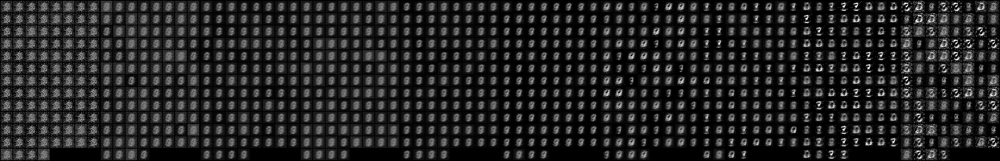

<<<<<<<<<>>>>>>>>>>
Batch : 1
<<<<<<<<<>>>>>>>>>>


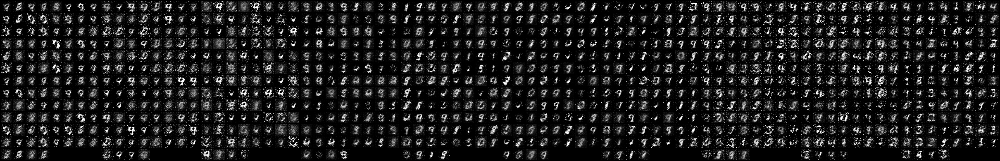

<<<<<<<<<>>>>>>>>>>
Batch : 2
<<<<<<<<<>>>>>>>>>>


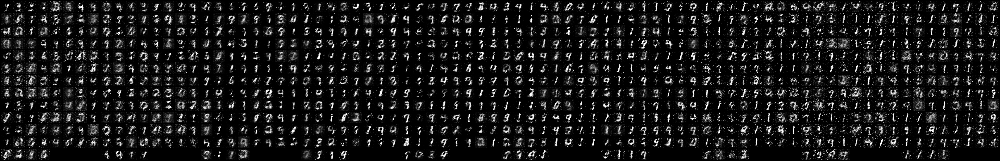

<<<<<<<<<>>>>>>>>>>
Batch : 3
<<<<<<<<<>>>>>>>>>>


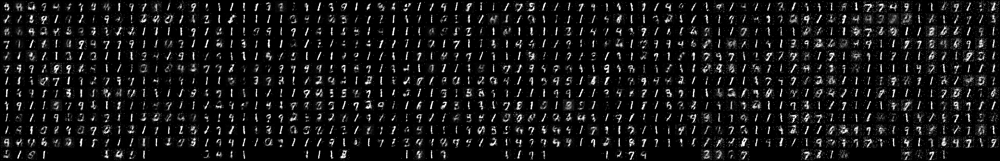

<<<<<<<<<>>>>>>>>>>
Batch : 4
<<<<<<<<<>>>>>>>>>>


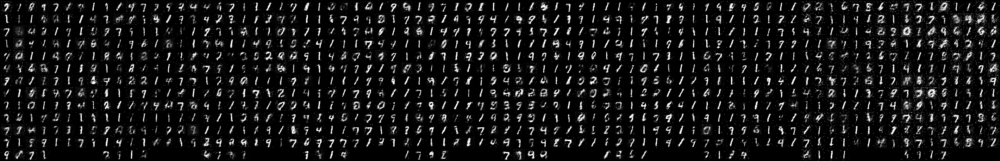

<<<<<<<<<>>>>>>>>>>
Batch : 5
<<<<<<<<<>>>>>>>>>>


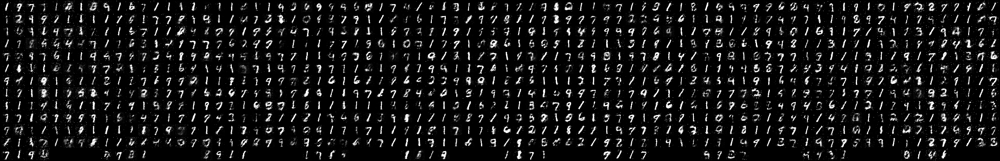

<<<<<<<<<>>>>>>>>>>
Batch : 6
<<<<<<<<<>>>>>>>>>>


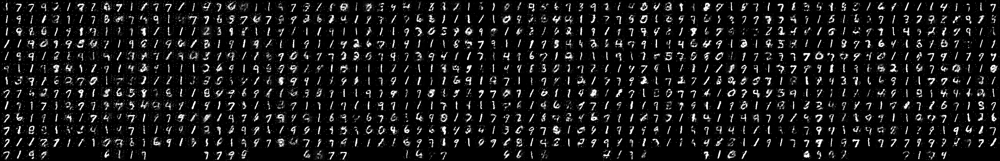

<<<<<<<<<>>>>>>>>>>
Batch : 7
<<<<<<<<<>>>>>>>>>>


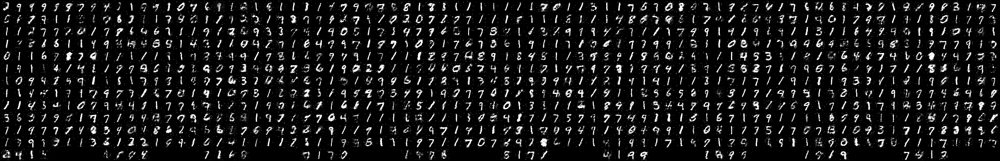

<<<<<<<<<>>>>>>>>>>
Batch : 8
<<<<<<<<<>>>>>>>>>>


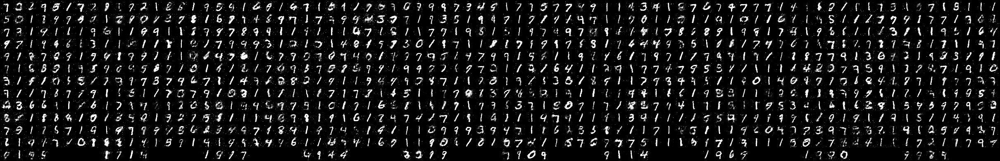

<<<<<<<<<>>>>>>>>>>
Batch : 9
<<<<<<<<<>>>>>>>>>>


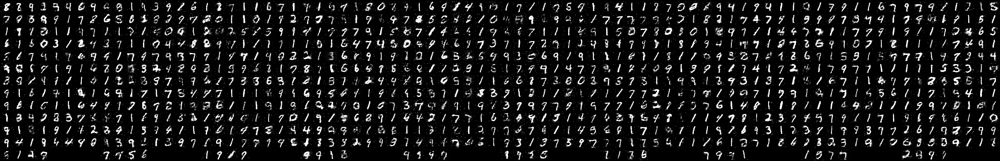

<<<<<<<<<>>>>>>>>>>
Batch : 10
<<<<<<<<<>>>>>>>>>>


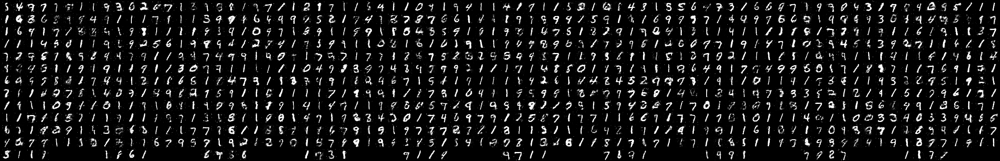

<<<<<<<<<>>>>>>>>>>
Batch : 11
<<<<<<<<<>>>>>>>>>>


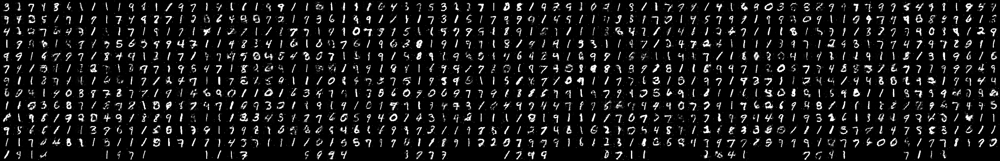

<<<<<<<<<>>>>>>>>>>
Batch : 12
<<<<<<<<<>>>>>>>>>>


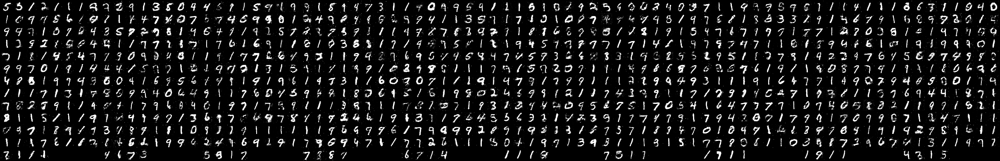

<<<<<<<<<>>>>>>>>>>
Batch : 13
<<<<<<<<<>>>>>>>>>>


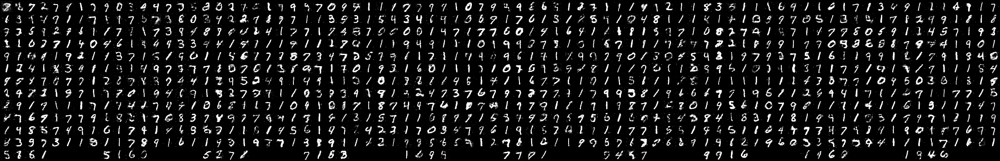

<<<<<<<<<>>>>>>>>>>
Batch : 14
<<<<<<<<<>>>>>>>>>>


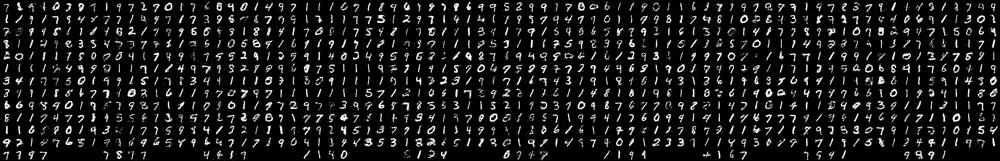

<<<<<<<<<>>>>>>>>>>
Batch : 15
<<<<<<<<<>>>>>>>>>>


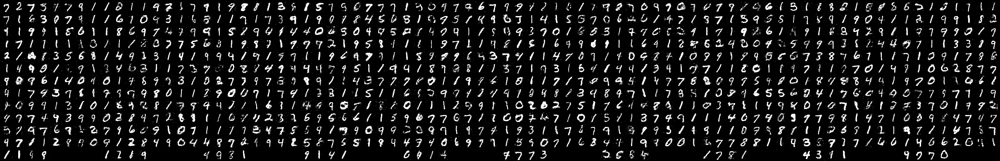

<<<<<<<<<>>>>>>>>>>
Batch : 16
<<<<<<<<<>>>>>>>>>>


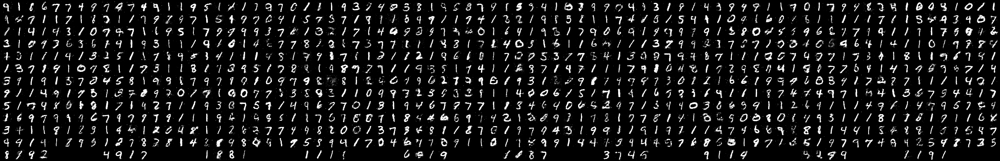

<<<<<<<<<>>>>>>>>>>
Batch : 17
<<<<<<<<<>>>>>>>>>>


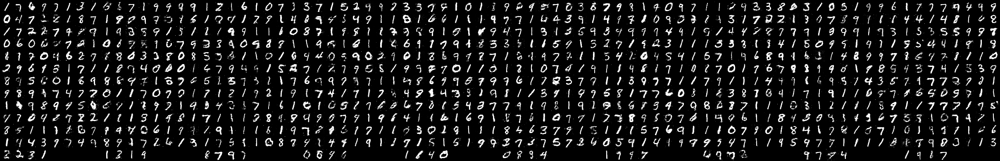

<<<<<<<<<>>>>>>>>>>
Batch : 18
<<<<<<<<<>>>>>>>>>>


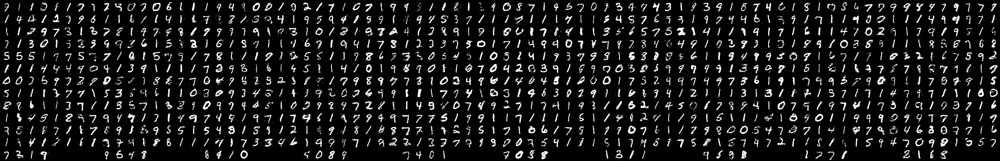

<<<<<<<<<>>>>>>>>>>
Batch : 19
<<<<<<<<<>>>>>>>>>>


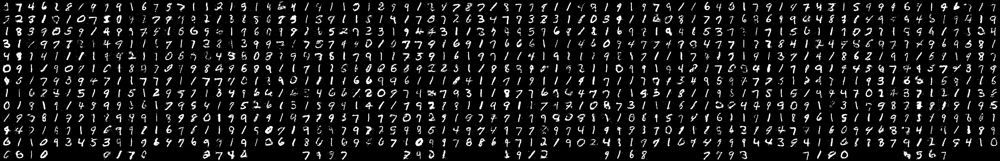

In [5]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
cntr = 1
for blk in range(20):
 img_arr = [cv2.imread('/content/fake_images-'+str(cntr)+'.png')]
 cntr += 1
 for i in range(1,10):
   img_arr.append(cv2.imread('/content/fake_images-'+str(cntr)+'.png'))
   cntr += 1
 pctrs = np.hstack(img_arr)
 print("<<<<<<<<<>>>>>>>>>>")
 print("Batch :",blk)
 print("<<<<<<<<<>>>>>>>>>>")
 cv2_imshow(pctrs)
 #print(img_arr)